In [1]:
import matplotlib.pyplot as plt
import numpy as np
import math
from scipy import stats, signal
import radartrack as rt
import beeview
from PIL import Image as Image
from pprint import pprint
from hypothesis10 import *
import gc as gc
from matplotlib.colors import LogNorm
from scipy import cluster
from scipy import spatial
import os
from sys import stdout

In [ ]:
# step 1:
# for each flight: create a hog for each pixel in the image ("eye"). shape: 112,131 (width, height)
# step 1.1: load movie
# step 1.2: sobel filter each image in movie
# step 1.3: reshape the array of sobel-filtered images so that each pixel is 1 array
# step 1.4: create hog for each pixel, binsize = 10°
# step 1.5: weight and normalize??
# weight: each edge votes with edge-strength into the histogramm
# normalize the amplitude so that max amp = 1
# normalize the direction so that 0 = 0°, 180°; 10 = 10°,190°; ... 50 = 50°,230°; ... 170 = 170°, 350°###
#   formula: (x + 180) % 180

# step 2:
# clustering
# description of data: 112 x 131 x nBins(18) = 14672 * 18 =  264096 data points per flight

In [2]:
data_folder = '../data'

In [3]:
#step 1.1 load movies:

all_flight_movies = []
flight_numbers_no_dups = [236, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 471, 472, 473, 474, 475, 476, 477, 478, 479, 480, 481, 482, 483, 484, 485, 486, 487, 488, 489, 490, 491, 492, 493, 494, 495, 496, 497, 498, 499, 500, 501, 502, 503, 504, 505, 506, 507, 508, 509, 510, 511, 512, 513, 514, 515, 516, 517, 518, 519, 520, 521, 522]
all_flights_dir = os.path.join(data_folder,'all_flights_1px')
for i in range(0,523):
    if i in flight_numbers_no_dups:
        all_flight_movies.append(rt.movie.load('flight_' + str(i) + '_1px',all_flights_dir,verbose=False))
        stdout.write("\r%d%%" % (i/523*100))
        stdout.flush()

99%

In [4]:
def calc_gradients(img):
    scharr = np.array([[ -3 - 3j, 0 - 10j, +3 - 3j],
                           [-10 + 0j, 0 + 0j, +10 + 0j],
                           [ -3 + 3j, 0 + 10j, +3 + 3j]])

    grad = signal.convolve2d(img, scharr, boundary='fill', mode='same')
    
    return (np.angle(grad), np.absolute(grad))

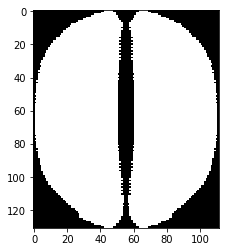

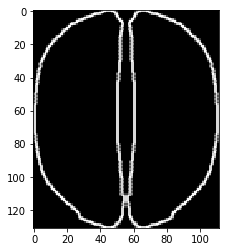

In [5]:
# create a mask (dont count edge pixels of eye-edge)
img = Image.open(os.path.join(data_folder,'mask_render.png'))
img = np.asarray(img)

plt.imshow(img)
plt.show()

img = np.dot(img, [0.299, 0.587, 0.114])        
dirs, img = calc_gradients(img)

plt.imshow(img,cmap='gray')
plt.show()

img = Image.fromarray(img)
img = img.convert('RGB')
img.save(os.path.join(data_folder,"mask_edges.png"))

# then create mask with photoshop with only the inner part of the edge-picture 

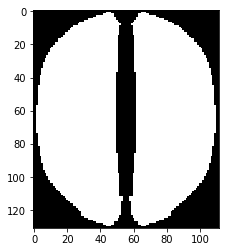

(131, 112)

In [6]:
# mask for only the eyes (minus the edge-boundary)

mask = Image.open(os.path.join(data_folder,'mask.png'))
plt.imshow(mask)
plt.show()
mask = np.asarray(mask)
mask = mask[:,:,0] == 255
mask.shape

In [7]:
def calc_hists(flight_movie, use_mask = True):
    hists = {'weights': [], 'edges': []}

    # idx duplicates
    old_idx = -1       
    for segment in flight_movie.flight.segments:
        path_type = segment.type

        # ignore gaps 
        if path_type not in ('line', 'search'):
            continue
            
        for idx,pos,vec in segment.interpolated:

            if old_idx == idx:
                old_idx = idx
                continue
            old_idx = idx

            # convert to grayscale
            img = np.dot(flight_movie.movie[idx], [0.299, 0.587, 0.114])        

            hist = calc_gradients(img)
            hists['edges'].append(hist[0])
            hists['weights'].append(hist[1])
    
    # instead for each image in movie we want for each pixel in movie
    edge_weights_eye = np.moveaxis(hists['weights'],0,2)
    edge_dirs_eye = np.moveaxis(hists['edges'],0,2)
    
    # weight nan values with 0
    edge_weights_eye[np.isnan(edge_dirs_eye)] = 0
    edge_weights_eye[np.isnan(edge_weights_eye)] = 0
    edge_dirs_eye[np.isnan(edge_dirs_eye)] = 0
    
    # weight everything outside mask with 0
    if use_mask:
        edge_weights_eye[~mask] = 0
    
    # make flipped edges same as edges
    edge_dirs_eye = np.where(edge_dirs_eye < 0, edge_dirs_eye + math.pi, edge_dirs_eye)
       
    hists = []
    
    # foreach pixel
    for i in range(0,edge_dirs_eye.shape[0]):
            hists.append([])
            for j in range(0,edge_dirs_eye.shape[1]):    
                #print("calc pixel " + str(i) + "," + str(j) )   
                
                hist, bins = np.histogram(edge_dirs_eye[i,j] , bins=20, range=(0,math.pi), weights=edge_weights_eye[i,j] , density=True)

                hists[i].append(hist)
                
    return np.array(hists)

In [8]:
# calculate all the histogramms and save to disk for later use
for flight_movie in all_flight_movies:
    hist = calc_hists(flight_movie)
    stdout.write("\r%s" % flight_movie.name)
    stdout.flush()
    np.save(os.path.join(os.path.join(data_folder,'selected_movie_hists'), flight_movie.name),hist)

C:\Users\Tscho\Anaconda3\lib\site-packages\numpy\lib\function_base.py:812: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bins


flight_522_1px

In [9]:
# load the hists from disk

all_hists = []
for file in os.listdir(os.path.join(data_folder,'selected_movie_hists')):
    all_hists.append(np.load(os.path.join(os.path.join(data_folder,'selected_movie_hists'), file)))


In [18]:
# test with first and second flight

hists0 = calc_hists(all_flight_movies[1])
hists1 = calc_hists(all_flight_movies[2])

C:\Users\Tscho\Anaconda3\lib\site-packages\numpy\lib\function_base.py:812: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bins


In [19]:
np.sum(np.isnan(hists0))

92000

In [20]:
np.sum(np.isnan(hists0[mask]))

0

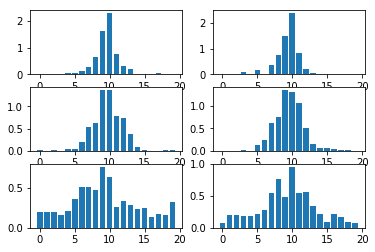

Compare row wise
0.162430130374
0.0829409495177
0.147510638793
Compare first hist with all in first column
0.0
0.131760418869
0.688951784706


In [22]:
# test kl-divergence 


# div zero error for kl divergenz
hists0_zero = np.copy(hists0)
hists0_zero[hists0_zero==0] = 0.000001
hists1_zero = np.copy(hists1)
hists1_zero[hists1_zero==0] = 0.000001


plt.subplot(321)
plt.bar(range(0,20),hists0_zero[60,40])
plt.subplot(322)
plt.bar(range(0,20),hists1_zero[60,40])

plt.subplot(323)
plt.bar(range(0,20),hists0_zero[65,40])
plt.subplot(324)
plt.bar(range(0,20),hists1_zero[65,40])

plt.subplot(325)
plt.bar(range(0,20),hists0_zero[70,40])
plt.subplot(326)
plt.bar(range(0,20),hists1_zero[70,40])

plt.show() 

print("Compare row wise")
print(stats.entropy(hists0_zero[60,40],hists1_zero[60,40]))
print(stats.entropy(hists0_zero[65,40],hists1_zero[65,40]))
print(stats.entropy(hists0_zero[70,40],hists1_zero[70,40]))
print("Compare first hist with all in first column")
print(stats.entropy(hists0_zero[60,40],hists0_zero[60,40]))
print(stats.entropy(hists0_zero[60,40],hists0_zero[65,40]))
print(stats.entropy(hists0_zero[60,40],hists0_zero[70,40]))


In [23]:
# Kullback-Leibler divergence
def kl_divergence(movie_hist1,movie_hist2): 
    # movie_hist is 112 * 132 histogramms (for each pixel 1 histogramm)
    # calculate differences pairwise for each histogramm and add up
    
    kl_dist = 0

    movie_hist1[movie_hist1==0] = 0.000001
    movie_hist2[movie_hist2==0] = 0.000001
    for x in range(0,movie_hist1.shape[0]):
        for y in range(0,movie_hist1.shape[1]):
            
            # only on mask
            if mask[x,y]: 
                kl_dist += stats.entropy(movie_hist1[x,y],movie_hist2[x,y])
        
    return kl_dist

In [ ]:
# calculate distance table with kl

distance_table = np.zeros((len(all_hists),len(all_hists)))
for i in range(0,len(all_hists)):
    stdout.write("\r%d%%" % (i/len(all_hists) * 100))
    stdout.flush()
    for j in range(0,len(all_hists)):
        stdout.write(".")
        distance_table[i,j] = kl_divergence(all_hists[i],all_hists[j])

In [28]:
np.save('distance_matrix_kl',distance_table)

In [29]:
distance_matrix = np.load("distance_matrix_kl.npy")

In [30]:
distance_matrix.shape

(185, 185)

In [31]:
distance_matrix[:10,0]

array([     0.        ,  71666.31566993,  70423.19109192,  65792.97215178,
        73061.68174537,  71922.2986996 ,  64905.59375729,  73869.05570423,
        70470.79306257,  72688.37540172])

In [32]:
# make distance matrix symmetric (or else cant calulate linkage matrix), because dist(x,y) != dist(y,x) -> problem, use chi2 instead?
distance_matrix2 = np.zeros_like(distance_matrix)
for x in range(0,distance_matrix.shape[0]):
    for y in range(0,distance_matrix.shape[1]):
        distance_matrix2[y,x] = distance_matrix[x,y]
        distance_matrix2[x,y] = distance_matrix[x,y]

In [33]:
dist_matrix2 = spatial.distance.squareform(distance_matrix2)
dist_matrix2.shape

(17020,)

In [109]:
%matplotlib notebook
%matplotlib notebook

In [50]:
%matplotlib inline

<IPython.core.display.Javascript object>


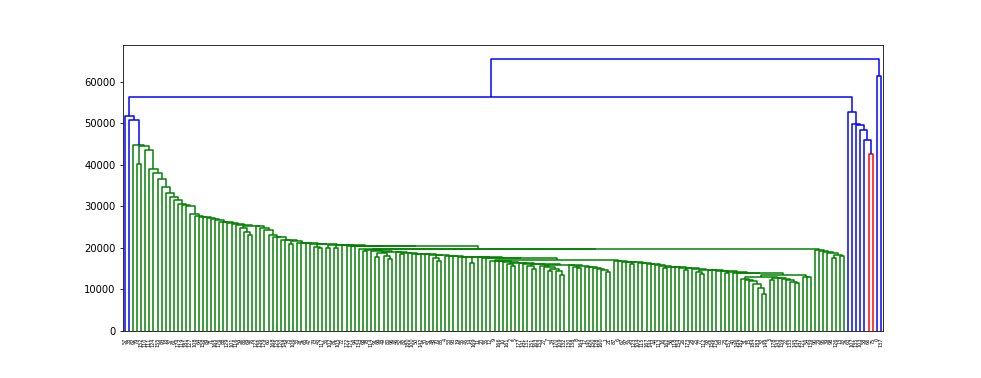

In [110]:
linkage = cluster.hierarchy.linkage(dist_matrix2, method="average")

cluster.hierarchy.dendrogram(
    linkage
)
plt.show()

<IPython.core.display.Javascript object>


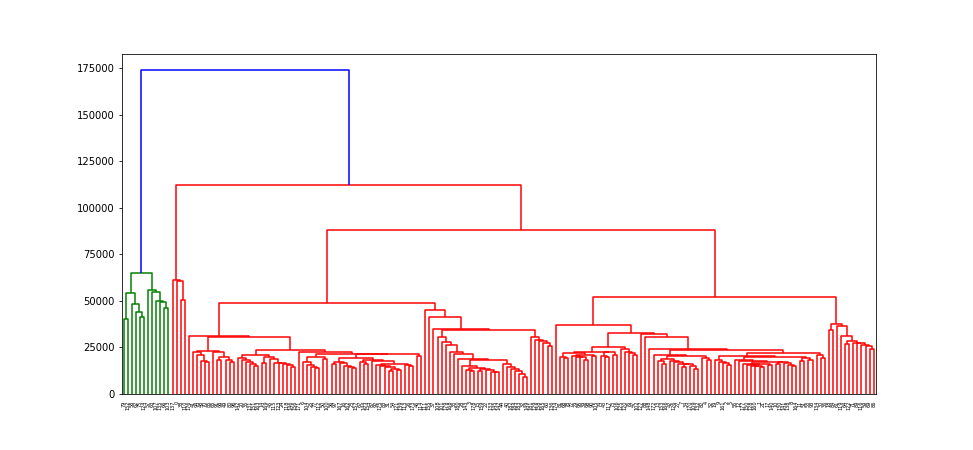

In [111]:
linkage = cluster.hierarchy.linkage(dist_matrix2, method="ward")

cluster.hierarchy.dendrogram(
    linkage,
    show_contracted=True,
)
plt.show()

In [59]:
# get the 2 main clusters
clusters = cluster.hierarchy.fcluster(linkage, 2, criterion='maxclust')

In [71]:
# get the flights in same order as movies
all_flights = []
for movie in all_flight_movies:
    all_flights.append(movie.flight)

In [72]:
the_map = rt.data.maps['drone_map_zoom', 'color_small']

In [73]:
all_flights = np.array(all_flights)

In [74]:
len(all_flights[clusters==1])

11

In [75]:
len(all_flights[clusters==2])

174

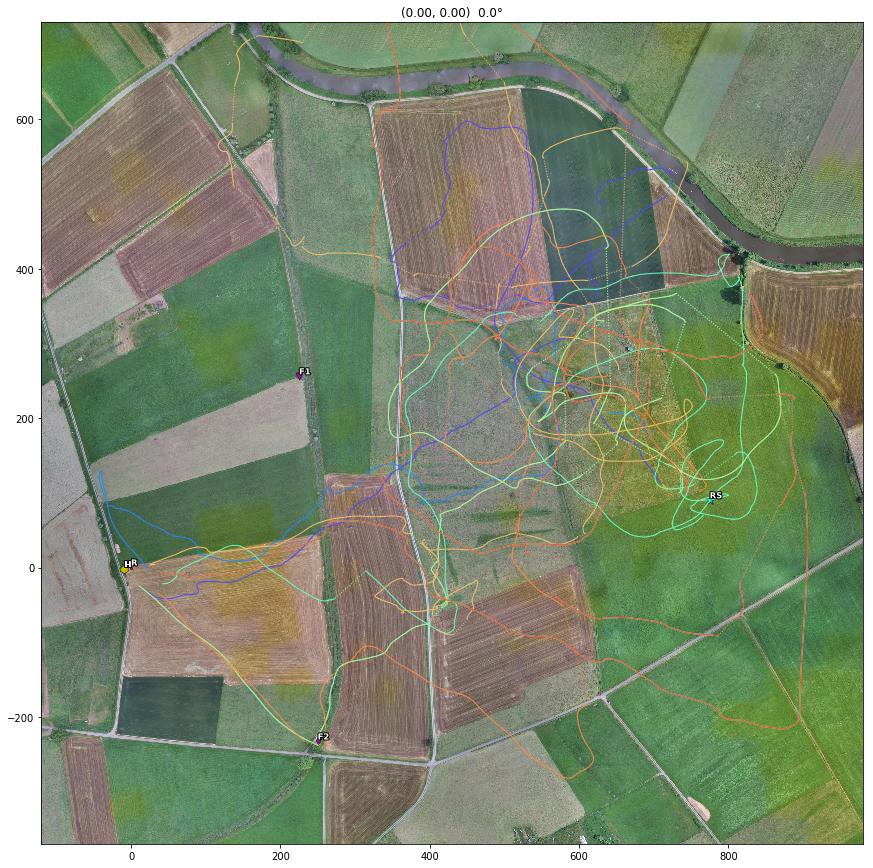

In [77]:
% matplotlib inline
plotter = rt.plot.Plotter()
plotter.new_figure(figsize=(16, 12)) \
       .set_map( rt.data.maps['drone_map_zoom', 'color_small']) \
       .set_markers(rt.data.markers[...]) \
       .set_flights(np.random.choice(all_flights[clusters==1],10)) \
       .draw_interpolated() \
       .plot() \
       .show();

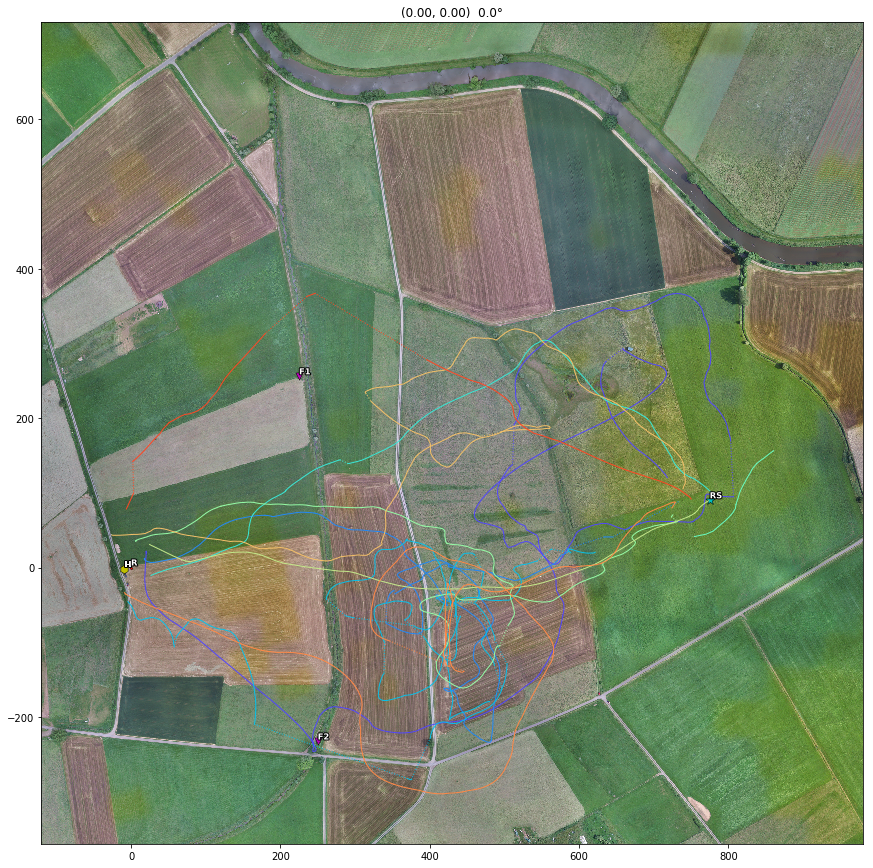

In [78]:
plotter = rt.plot.Plotter()
plotter.new_figure(figsize=(16, 12)) \
       .set_map( rt.data.maps['drone_map_zoom', 'color_small']) \
       .set_markers(rt.data.markers[...]) \
       .set_flights(np.random.choice(all_flights[clusters==2],10)) \
       .draw_interpolated() \
       .plot() \
       .show();

In [87]:
# try chi2 dist, because symmetrical

def chi2_dist(p,q):
    p[np.isnan(p)] = 0
    q[np.isnan(q)] = 0
    return np.sum((p-q)**2/(p+q+1e-6))

In [88]:
# chi2 is symmetrical, 
print(chi2_dist(all_hists[0],all_hists[1]))
print(chi2_dist(all_hists[1],all_hists[0]))

62439.2960297
62439.2960297


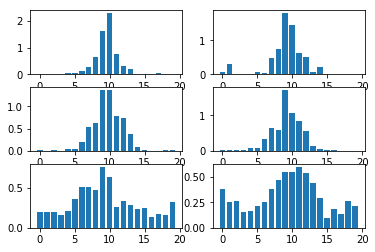

1.09156794631
0.353540183762
0.604198141652
0.0
0.832521532608
4.02138690022


In [93]:
plt.subplot(321)
plt.bar(range(0,20),all_hists[1][60,40])
plt.subplot(322)
plt.bar(range(0,20),all_hists[57][60,40])

plt.subplot(323)
plt.bar(range(0,20),all_hists[1][65,40])
plt.subplot(324)
plt.bar(range(0,20),all_hists[57][65,40])

plt.subplot(325)
plt.bar(range(0,20),all_hists[1][70,40])
plt.subplot(326)
plt.bar(range(0,20),all_hists[57][70,40])

plt.show() 

print(chi2_dist(all_hists[1][60,40],all_hists[57][60,40]))
print(chi2_dist(all_hists[1][65,40],all_hists[57][65,40]))
print(chi2_dist(all_hists[1][70,40],all_hists[57][70,40]))

print(chi2_dist(all_hists[1][60,40],all_hists[1][60,40]))
print(chi2_dist(all_hists[1][60,40],all_hists[1][65,40]))
print(chi2_dist(all_hists[1][60,40],all_hists[1][70,40]))

In [98]:
# calculate upper half of distance matrix with chi2 method
distance_table = np.zeros((len(all_hists),len(all_hists)))
for i in range(0,len(all_hists)):
    for j in range(i,len(all_hists)):
        distance_table[i,j] = chi2_dist(all_hists[i],all_hists[j])
        stdout.write("\r%d%%" % ((i*len(all_hists)+j)/(len(all_hists)*2)))
        stdout.flush()

92%

In [99]:
# make the table symetrical
for x in range(0,distance_table.shape[0]):
    for y in range(0,distance_table.shape[1]):
        distance_table[y,x] = distance_table[x,y]


In [100]:
np.save('distance_matrix_chi2',distance_table)

In [101]:
# compare the chi2-distance matrix with the kl-divergence matrix 

dist_matrix_chi = np.load('distance_matrix_chi2.npy')
dist_matrix_kl = np.load('distance_matrix_kl.npy')

In [102]:
d1 = dist_matrix_chi.flatten()
d2 = dist_matrix_kl.flatten()

(0.89074943158707043, 0.0)

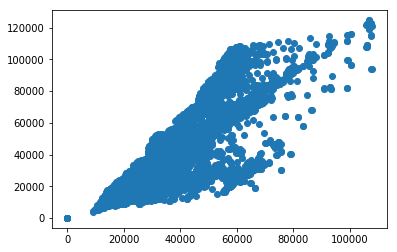

In [103]:
plt.scatter(d1,d2)
plt.plot()
stats.pearsonr(d1,d2)

In [104]:
# compare upper and lowe halfs of matrices (kl divergence is not symetrical: dist(a,b) != dist(b,a))
d1_upper = dist_matrix_chi[np.triu_indices(dist_matrix_chi.shape[0])].flatten()
d1_lower = dist_matrix_chi[np.tril_indices(dist_matrix_chi.shape[0])].flatten()

d2_upper = dist_matrix_kl[np.triu_indices(dist_matrix_kl.shape[0])].flatten()
d2_lower = dist_matrix_kl[np.tril_indices(dist_matrix_kl.shape[0])].flatten()


<IPython.core.display.Javascript object>


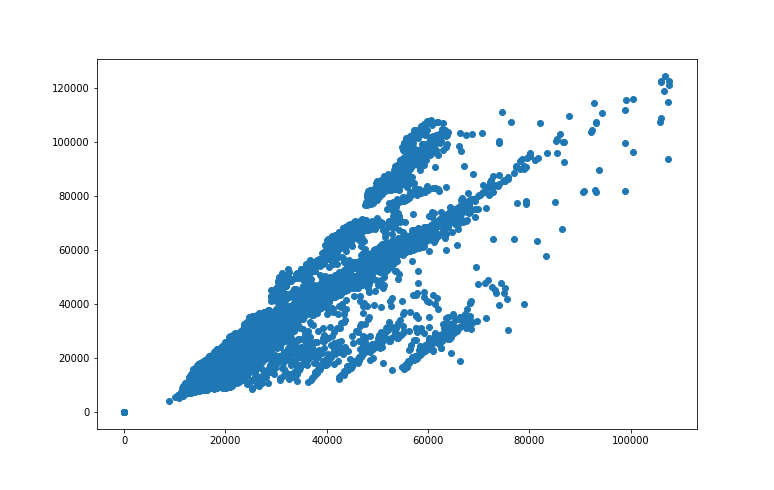

(0.88283929932896088, 0.0)

In [112]:
plt.scatter(d1_upper,d2_upper)
plt.plot()
stats.pearsonr(d1_upper,d2_upper)

<IPython.core.display.Javascript object>


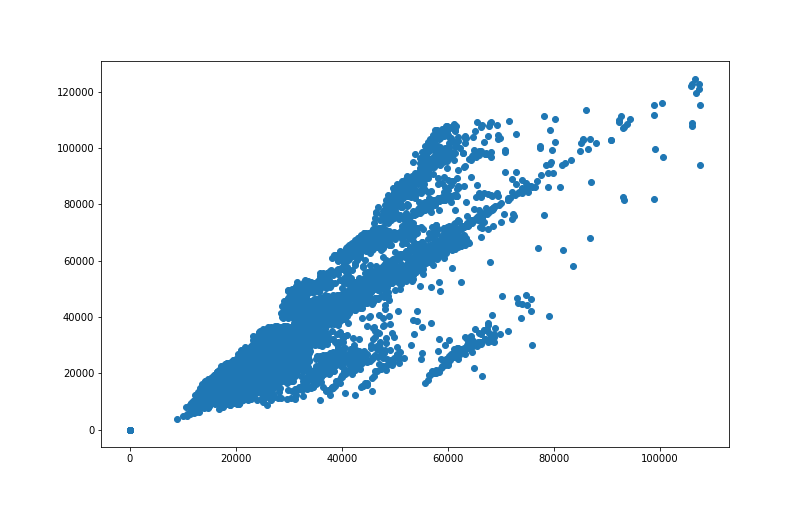

(0.90118878665171598, 0.0)

In [113]:
plt.scatter(d1_lower,d2_lower)
plt.plot()
stats.pearsonr(d1_lower,d2_lower)

In [107]:
# convert the distmatrix for cluster input
dist_matrix2 = spatial.distance.squareform(dist_matrix_chi)

<IPython.core.display.Javascript object>


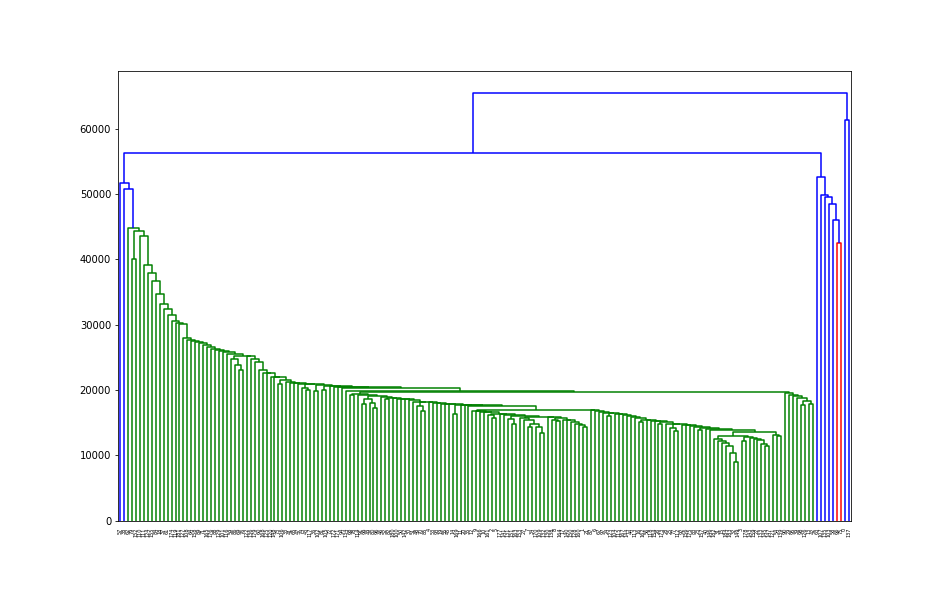

In [114]:
linkage = cluster.hierarchy.linkage(dist_matrix2, method="average")
cluster.hierarchy.dendrogram(
    linkage
)
plt.show()

<IPython.core.display.Javascript object>


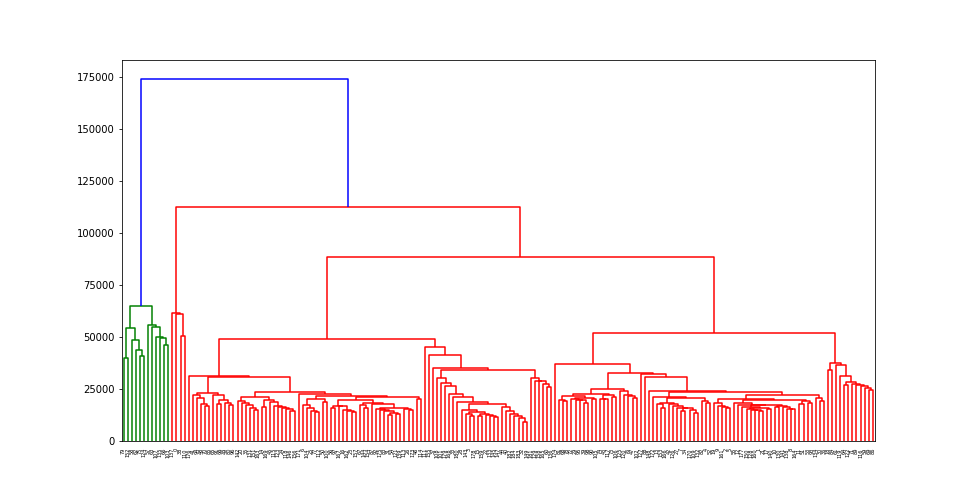

In [115]:
# try different distance measure (between clusters)
linkage = cluster.hierarchy.linkage(dist_matrix2, method="ward")

cluster.hierarchy.dendrogram(
    linkage,
)
plt.show()

In [116]:
# get 2 clusters
clusters = cluster.hierarchy.fcluster(linkage, 2, criterion='maxclust')

In [117]:
len(all_flights[clusters==1])

12

In [118]:
len(all_flights[clusters==2])

173

<IPython.core.display.Javascript object>


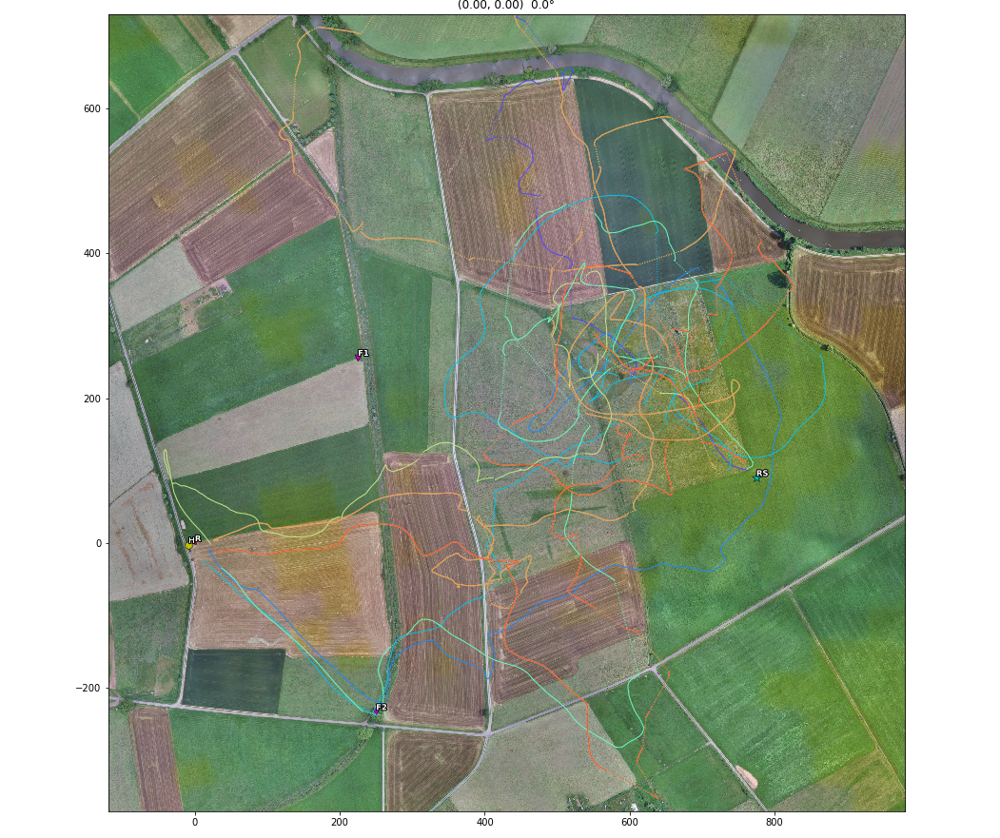

In [119]:
# plot 10 random flights from cluster 1
plotter = rt.plot.Plotter()
plotter.new_figure(figsize=(16, 12)) \
       .set_map( rt.data.maps['drone_map_zoom', 'color_small']) \
       .set_markers(rt.data.markers[...]) \
       .set_flights(np.random.choice(all_flights[clusters==1],10)) \
       .draw_interpolated() \
       .plot() \
       .show();

<IPython.core.display.Javascript object>


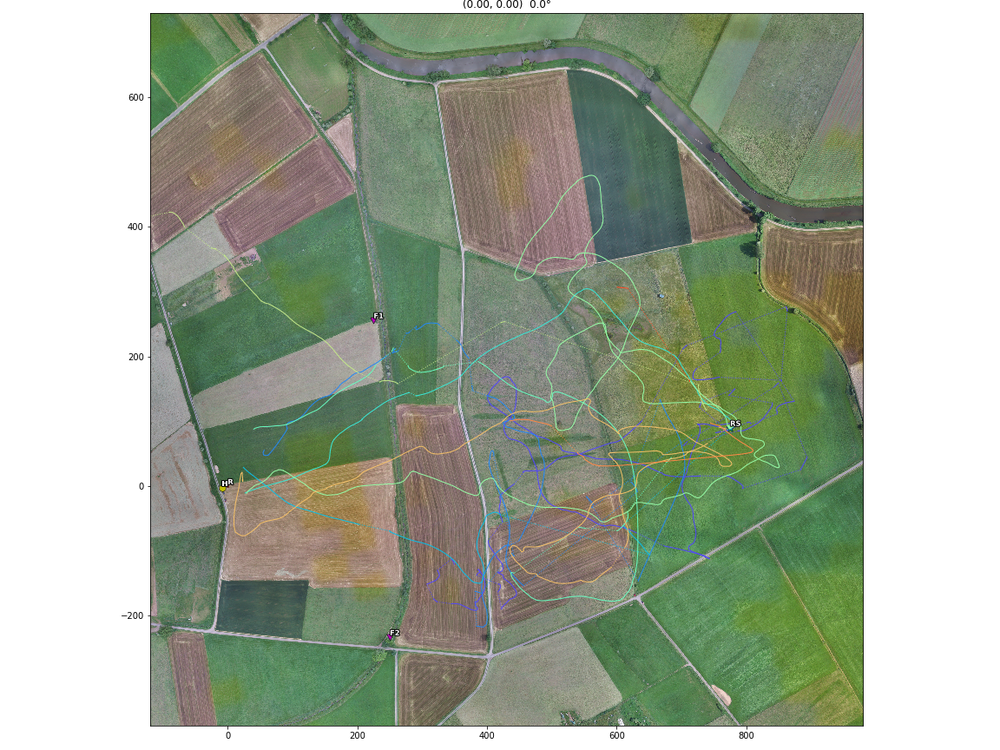

In [121]:
# plot 10 random flights from cluster 2

plotter = rt.plot.Plotter()
plotter.new_figure(figsize=(16, 12)) \
       .set_map( rt.data.maps['drone_map_zoom', 'color_small']) \
       .set_markers(rt.data.markers[...]) \
       .set_flights(np.random.choice(all_flights[clusters==2],10)) \
       .draw_interpolated() \
       .plot() \
       .show();